In [13]:
#Import packages
import xarray as xr
import pandas as pd
import numpy as np
import datetime as dt
import s3fs
import geocat.comp
from datetime import datetime
import dask
import zarr
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import netCDF4
import os
import proplot as pplt
import warnings
from numpy import meshgrid, deg2rad, gradient, cos, sin
from xarray import DataArray
from scipy import stats
from sklearn.preprocessing import StandardScaler as scale
from sklearn import preprocessing
from scipy import signal
warnings.filterwarnings('ignore')

In [14]:
path = '../../../home/jupyter-haruki/work/processed/to_s3/compress.isosph5.'

modelNames=['CESM2','CESM2-FV2','CESM2-WACCM','CanESM5','E3SM-1-1-ECA','E3SM-1-1','CMCC-CM2-SR5',
           'FGOALS-g3','GFDL-CM4','MIROC6','MRI-ESM2-0','SAM0-UNICON']
#'MPI-ESM-1-2-HAM', 'CESM2-WACCM-FV2'
inputstr='.historical.r1i1p1f1.Input.Exp8_fixed.nc'
outputstr='.historical.r1i1p1f1.Output.nc'

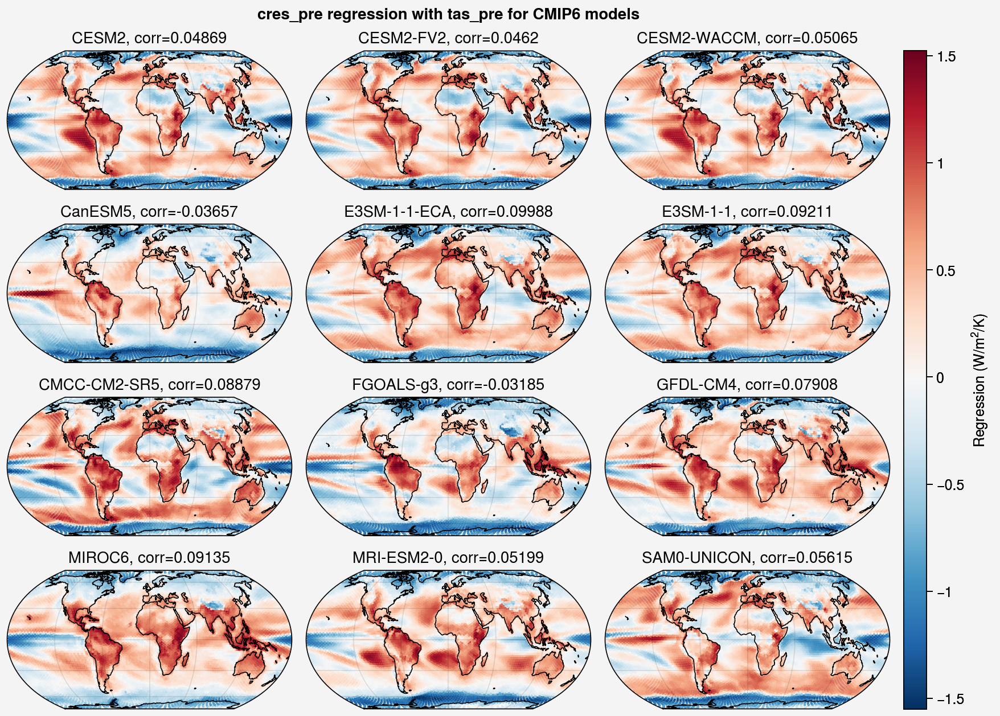

In [15]:
fig,axes = pplt.subplots([[1,2,3],[4,5,6],[7,8,9],[10,11,12]],proj='eqearth')
for i,name in enumerate(modelNames):
    Infiles=path+name+inputstr
    Indata=xr.open_dataset(Infiles)
    cres_pre=Indata['cres_pre']
    
    Outfiles=path+name+outputstr
    Outdata=xr.open_dataset(Outfiles)
    tas_pre=Outdata['tas_pre']
    
    lat=cres_pre.lat
    lon=cres_pre.lon
    
    tas_pre['ncells']=cres_pre['ncells']
    
    #print(cres_pre.shape)
   # print(tas_pre.shape)
    #Define the two standard deviation above mean condition for regression
    mystd=tas_pre.std()
    twostd=mystd*2
    mymean=tas_pre.mean()
    condition=twostd+mymean
    
    #define the regression function
    def linear_trend(x,y): 
        mask=np.isfinite(x)&np.isfinite(y)
        if len(x[mask])==0:
            return np.nan
        else:
            pf=np.polyfit(x[mask],y[mask],1)
            return xr.DataArray(pf[0])

    def ints(x,y):
        mask=np.isfinite(x)&np.isfinite(y)
        if len(x[mask])==0:
            return np.nan
        else:
            ipf=np.polyfit(x[mask],y[mask],1)
            return xr.DataArray(ipf[1])
    
    
    #Apply regression function using ufunc to get regression coefficients/slopes
    slopes=xr.apply_ufunc(linear_trend,
                        tas_pre,cres_pre,
                        vectorize=True,
                        dask='parallelized',
                        input_core_dims=[['time'],['time']],
                        )


    intercepts=xr.apply_ufunc(ints,
                        tas_pre,cres_pre,
                        vectorize=True,
                        dask='parallelized',
                        input_core_dims=[['time'],['time']],
                        )


    regression=slopes*condition+intercepts
    
    corr=xr.corr(tas_pre,cres_pre)
    corr=corr.round(5)
    
    con=axes[i].scatter(lon,lat,c=regression,s=1)
    axes[i].set_title(name + ', corr={0}'.format(corr.values))

fig.format(coast=True)
cbar=plt.colorbar(con)
cbar.set_label('Regression (W/$m^2$/K)')
axes.format(suptitle='cres_pre regression with tas_pre for CMIP6 models')
fig.save('cres_pre-tas_pre-regression.png')

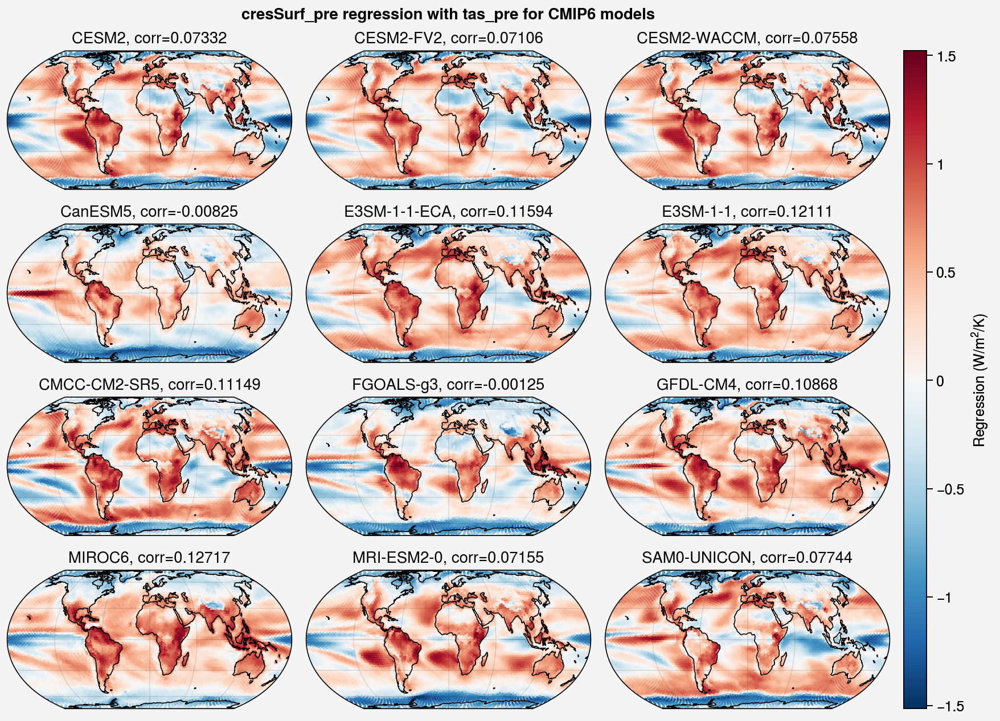

In [16]:
fig,axes = pplt.subplots([[1,2,3],[4,5,6],[7,8,9],[10,11,12]],proj='eqearth')
for i,name in enumerate(modelNames):
    Infiles=path+name+inputstr
    Indata=xr.open_dataset(Infiles)
    cresSurf_pre=Indata['cresSurf_pre']
    
    Outfiles=path+name+outputstr
    Outdata=xr.open_dataset(Outfiles)
    tas_pre=Outdata['tas_pre']
    
    lat=cresSurf_pre.lat
    lon=cresSurf_pre.lon
    
    tas_pre['ncells']=cresSurf_pre['ncells']
    
    #print(cresSurf_pre.shape)
   # print(tas_pre.shape)
    #Define the two standard deviation above mean condition for regression
    mystd=tas_pre.std()
    twostd=mystd*2
    mymean=tas_pre.mean()
    condition=twostd+mymean
    
    #define the regression function
    def linear_trend(x,y): 
        mask=np.isfinite(x)&np.isfinite(y)
        if len(x[mask])==0:
            return np.nan
        else:
            pf=np.polyfit(x[mask],y[mask],1)
            return xr.DataArray(pf[0])

    def ints(x,y):
        mask=np.isfinite(x)&np.isfinite(y)
        if len(x[mask])==0:
            return np.nan
        else:
            ipf=np.polyfit(x[mask],y[mask],1)
            return xr.DataArray(ipf[1])
    
    
    #Apply regression function using ufunc to get regression coefficients/slopes
    slopes=xr.apply_ufunc(linear_trend,
                        tas_pre,cresSurf_pre,
                        vectorize=True,
                        dask='parallelized',
                        input_core_dims=[['time'],['time']],
                        )


    intercepts=xr.apply_ufunc(ints,
                        tas_pre,cresSurf_pre,
                        vectorize=True,
                        dask='parallelized',
                        input_core_dims=[['time'],['time']],
                        )


    regression=slopes*condition+intercepts
    
    corr=xr.corr(tas_pre,cresSurf_pre)
    corr=corr.round(5)
    
    con=axes[i].scatter(lon,lat,c=regression,s=1)
    axes[i].set_title(name + ', corr={0}'.format(corr.values))

fig.format(coast=True)
cbar=plt.colorbar(con)
cbar.set_label('Regression (W/$m^2$/K)')
axes.format(suptitle='cresSurf_pre regression with tas_pre for CMIP6 models')
fig.save('cresSurf_pre-tas_pre-regression.png')

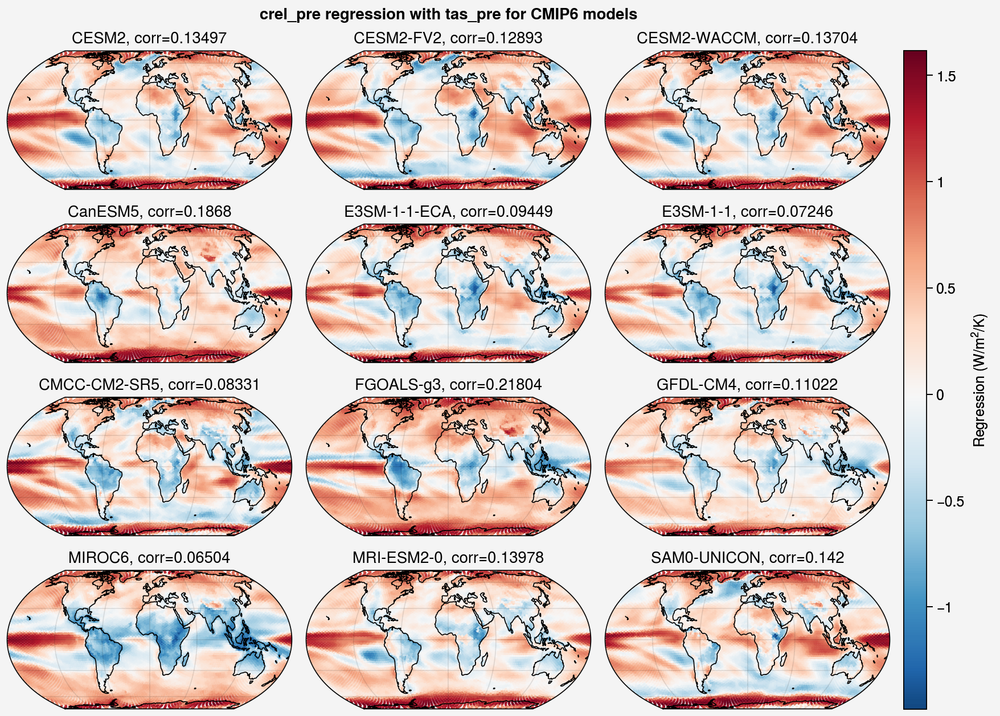

In [17]:
fig,axes = pplt.subplots([[1,2,3],[4,5,6],[7,8,9],[10,11,12]],proj='eqearth')
for i,name in enumerate(modelNames):
    Infiles=path+name+inputstr
    Indata=xr.open_dataset(Infiles)
    crel_pre=Indata['crel_pre']
    
    Outfiles=path+name+outputstr
    Outdata=xr.open_dataset(Outfiles)
    tas_pre=Outdata['tas_pre']
    
    lat=crel_pre.lat
    lon=crel_pre.lon
    
    tas_pre['ncells']=crel_pre['ncells']
    
    #print(crel_pre.shape)
   # print(tas_pre.shape)
    #Define the two standard deviation above mean condition for regression
    mystd=tas_pre.std()
    twostd=mystd*2
    mymean=tas_pre.mean()
    condition=twostd+mymean
    
    #define the regression function
    def linear_trend(x,y): 
        mask=np.isfinite(x)&np.isfinite(y)
        if len(x[mask])==0:
            return np.nan
        else:
            pf=np.polyfit(x[mask],y[mask],1)
            return xr.DataArray(pf[0])

    def ints(x,y):
        mask=np.isfinite(x)&np.isfinite(y)
        if len(x[mask])==0:
            return np.nan
        else:
            ipf=np.polyfit(x[mask],y[mask],1)
            return xr.DataArray(ipf[1])
    
    
    #Apply regression function using ufunc to get regression coefficients/slopes
    slopes=xr.apply_ufunc(linear_trend,
                        tas_pre,crel_pre,
                        vectorize=True,
                        dask='parallelized',
                        input_core_dims=[['time'],['time']],
                        )


    intercepts=xr.apply_ufunc(ints,
                        tas_pre,crel_pre,
                        vectorize=True,
                        dask='parallelized',
                        input_core_dims=[['time'],['time']],
                        )


    regression=slopes*condition+intercepts
    
    corr=xr.corr(tas_pre,crel_pre)
    corr=corr.round(5)
    
    con=axes[i].scatter(lon,lat,c=regression,s=1)
    axes[i].set_title(name + ', corr={0}'.format(corr.values))

fig.format(coast=True)
cbar=plt.colorbar(con)
cbar.set_label('Regression (W/$m^2$/K)')
axes.format(suptitle='crel_pre regression with tas_pre for CMIP6 models')
fig.save('crel_pre-tas_pre-regression.png')

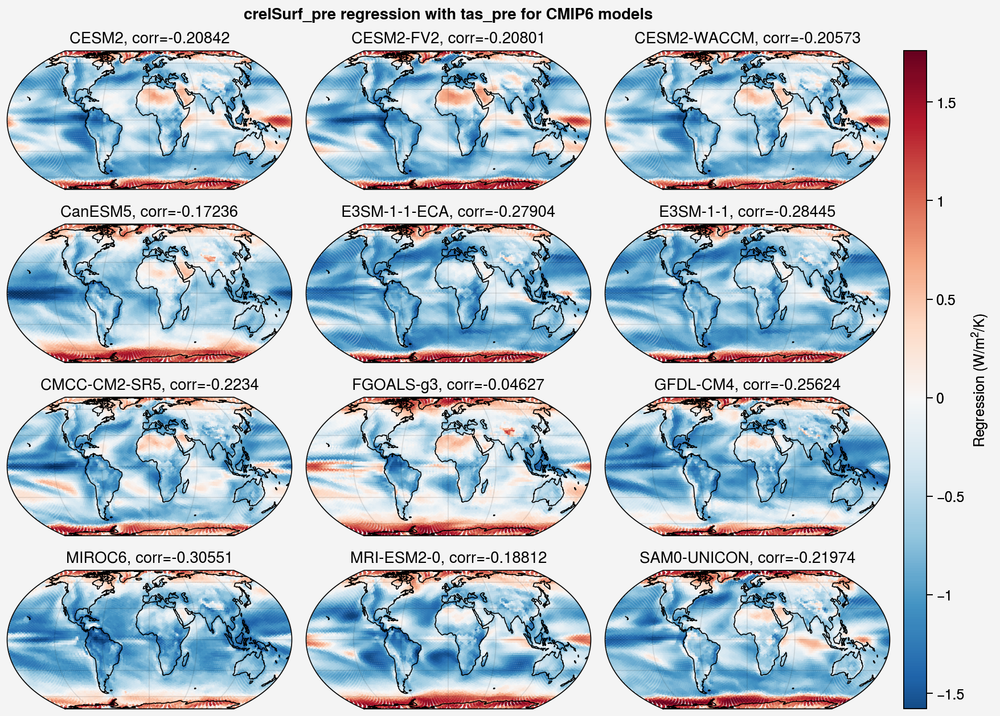

In [18]:
fig,axes = pplt.subplots([[1,2,3],[4,5,6],[7,8,9],[10,11,12]],proj='eqearth')
for i,name in enumerate(modelNames):
    Infiles=path+name+inputstr
    Indata=xr.open_dataset(Infiles)
    crelSurf_pre=Indata['crelSurf_pre']
    
    Outfiles=path+name+outputstr
    Outdata=xr.open_dataset(Outfiles)
    tas_pre=Outdata['tas_pre']
    
    lat=crelSurf_pre.lat
    lon=crelSurf_pre.lon
    
    tas_pre['ncells']=crelSurf_pre['ncells']
    
    #print(crelSurf_pre.shape)
   # print(tas_pre.shape)
    #Define the two standard deviation above mean condition for regression
    mystd=tas_pre.std()
    twostd=mystd*2
    mymean=tas_pre.mean()
    condition=twostd+mymean
    
    #define the regression function
    def linear_trend(x,y): 
        mask=np.isfinite(x)&np.isfinite(y)
        if len(x[mask])==0:
            return np.nan
        else:
            pf=np.polyfit(x[mask],y[mask],1)
            return xr.DataArray(pf[0])

    def ints(x,y):
        mask=np.isfinite(x)&np.isfinite(y)
        if len(x[mask])==0:
            return np.nan
        else:
            ipf=np.polyfit(x[mask],y[mask],1)
            return xr.DataArray(ipf[1])
    
    
    #Apply regression function using ufunc to get regression coefficients/slopes
    slopes=xr.apply_ufunc(linear_trend,
                        tas_pre,crelSurf_pre,
                        vectorize=True,
                        dask='parallelized',
                        input_core_dims=[['time'],['time']],
                        )


    intercepts=xr.apply_ufunc(ints,
                        tas_pre,crelSurf_pre,
                        vectorize=True,
                        dask='parallelized',
                        input_core_dims=[['time'],['time']],
                        )


    regression=slopes*condition+intercepts
    
    corr=xr.corr(tas_pre,crelSurf_pre)
    corr=corr.round(5)
    
    con=axes[i].scatter(lon,lat,c=regression,s=1)
    axes[i].set_title(name + ', corr={0}'.format(corr.values))

fig.format(coast=True)
cbar=plt.colorbar(con)
cbar.set_label('Regression (W/$m^2$/K)')
axes.format(suptitle='crelSurf_pre regression with tas_pre for CMIP6 models')
#fig.save('crelSurf_pre-tas_pre-regression.png')

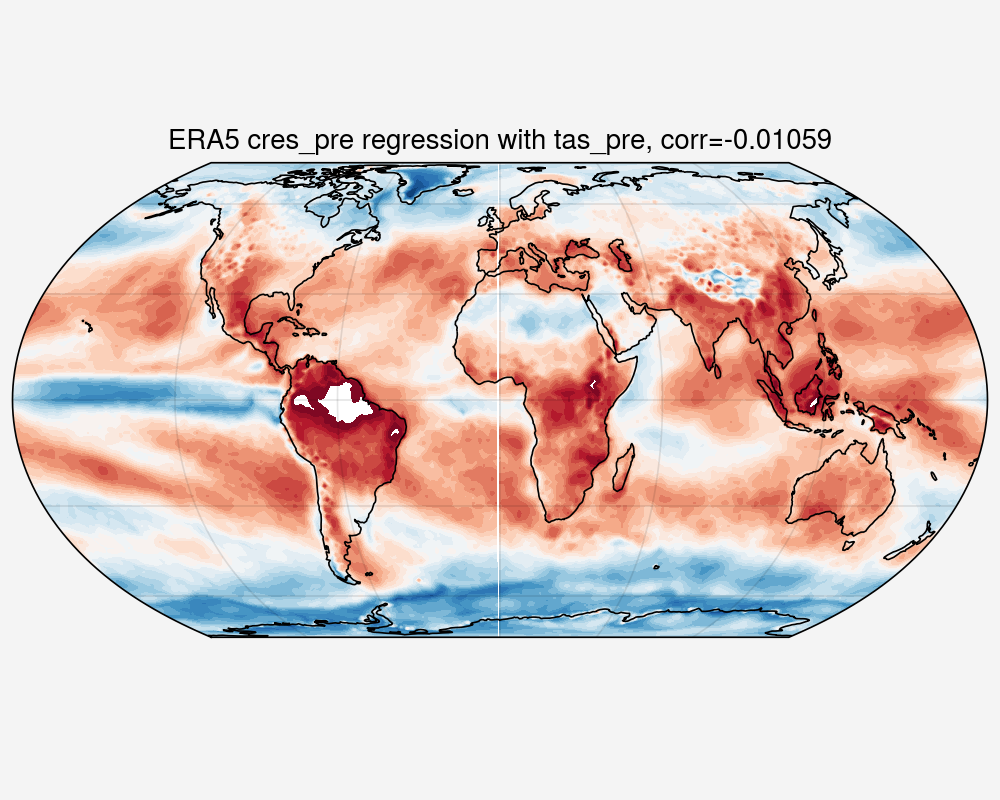

In [8]:
files='/home/jupyter-dipti/work/ISMR_CITCZ/Data/Regrided_ERA5.nc'
#Open ERA5 Dataset
data=xr.open_dataset(files)

cres_pre=data['cres_Pre']
tas_pre=data['tas_Pre']

lat=cres_pre.lat
lon=cres_pre.lon

tas_pre['time']=cres_pre['time']
    
    #Define the two standard deviation above mean condition for regression
mystd=tas_pre.std()
twostd=mystd*2
mymean=tas_pre.mean()
condition=twostd+mymean

#define the regression function
def linear_trend(x,y): 
    mask=np.isfinite(x)&np.isfinite(y)
    if len(x[mask])==0:
        return np.nan
    else:
        pf=np.polyfit(x[mask],y[mask],1)
        return xr.DataArray(pf[0])

def ints(x,y):
    mask=np.isfinite(x)&np.isfinite(y)
    if len(x[mask])==0:
        return np.nan
    else:
        ipf=np.polyfit(x[mask],y[mask],1)
        return xr.DataArray(ipf[1])
    
    
    #Apply regression function using ufunc to get regression coefficients/slopes
slopes=xr.apply_ufunc(linear_trend,
                    tas_pre,cres_pre,
                    vectorize=True,
                    dask='parallelized',
                    input_core_dims=[['time'],['time']],
                    )


intercepts=xr.apply_ufunc(ints,
                    tas_pre,cres_pre,
                    vectorize=True,
                    dask='parallelized',
                    input_core_dims=[['time'],['time']],
                    )


regression=slopes*condition+intercepts

corr=xr.corr(tas_pre,cres_pre)
corr=corr.round(5)

fig,axes=pplt.subplots(figsize=(5,4),proj='eqearth')
con=axes.contourf(lon,lat,regression,levels=np.arange(-1.5,1.5,0.1))
axes.set_title('ERA5 cres_pre regression with tas_pre, corr={0}'.format(corr.values))

fig.format(coast=True)
#cbar=plt.colorbar(con)
#cbar.set_label('Regression (W/$m^2$)')

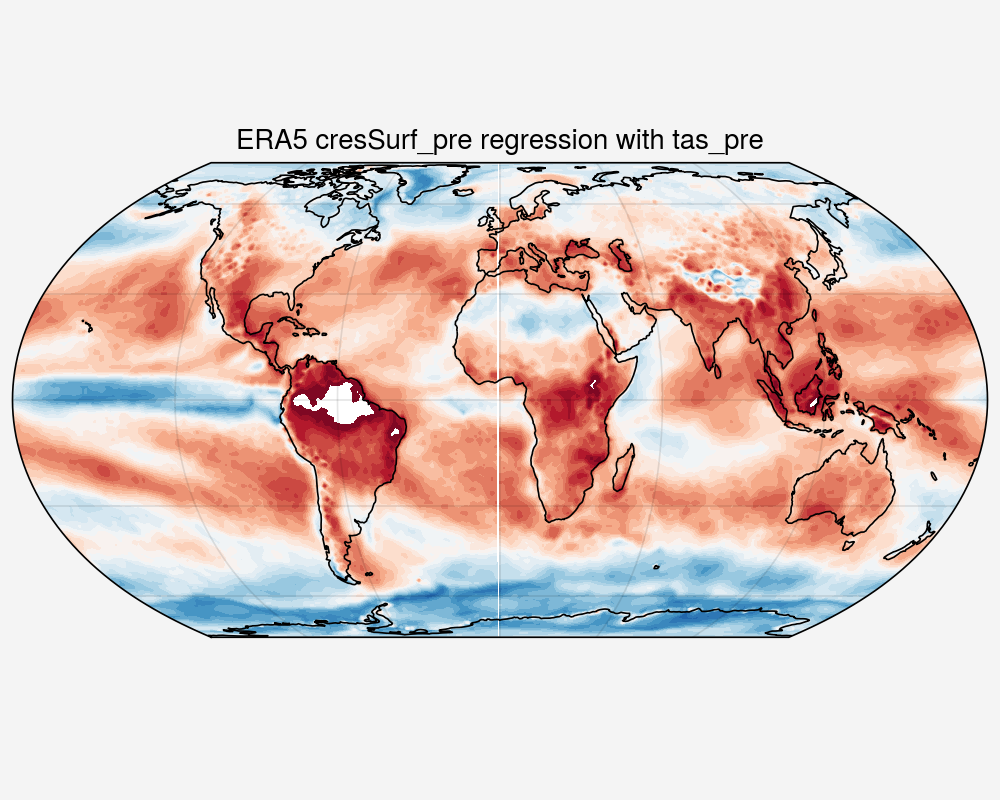

In [112]:
files='/home/jupyter-dipti/work/ISMR_CITCZ/Data/Regrided_ERA5.nc'
#Open ERA5 Dataset
data=xr.open_dataset(files)

cresSurf_pre=data['cresSurf_Pre']
tas_pre=data['tas_Pre']

lat=cresSurf_pre.lat
lon=cresSurf_pre.lon

tas_pre['time']=cresSurf_pre['time']
    
    #Define the two standard deviation above mean condition for regression
mystd=tas_pre.std()
twostd=mystd*2
mymean=tas_pre.mean()
condition=twostd+mymean

#define the regression function
def linear_trend(x,y): 
    mask=np.isfinite(x)&np.isfinite(y)
    if len(x[mask])==0:
        return np.nan
    else:
        pf=np.polyfit(x[mask],y[mask],1)
        return xr.DataArray(pf[0])

def ints(x,y):
    mask=np.isfinite(x)&np.isfinite(y)
    if len(x[mask])==0:
        return np.nan
    else:
        ipf=np.polyfit(x[mask],y[mask],1)
        return xr.DataArray(ipf[1])
    
    
    #Apply regression function using ufunc to get regression coefficients/slopes
slopes=xr.apply_ufunc(linear_trend,
                    tas_pre,cresSurf_pre,
                    vectorize=True,
                    dask='parallelized',
                    input_core_dims=[['time'],['time']],
                    )


intercepts=xr.apply_ufunc(ints,
                    tas_pre,cresSurf_pre,
                    vectorize=True,
                    dask='parallelized',
                    input_core_dims=[['time'],['time']],
                    )


regression=slopes*condition+intercepts

fig,axes=pplt.subplots(figsize=(5,4),proj='eqearth')
con=axes.contourf(lon,lat,regression,levels=np.arange(-1.5,1.5,0.1))
axes.set_title('ERA5 cresSurf_pre regression with tas_pre')

fig.format(coast=True)
#cbar=plt.colorbar(con)
#cbar.set_label('Regression (W/$m^2$)')

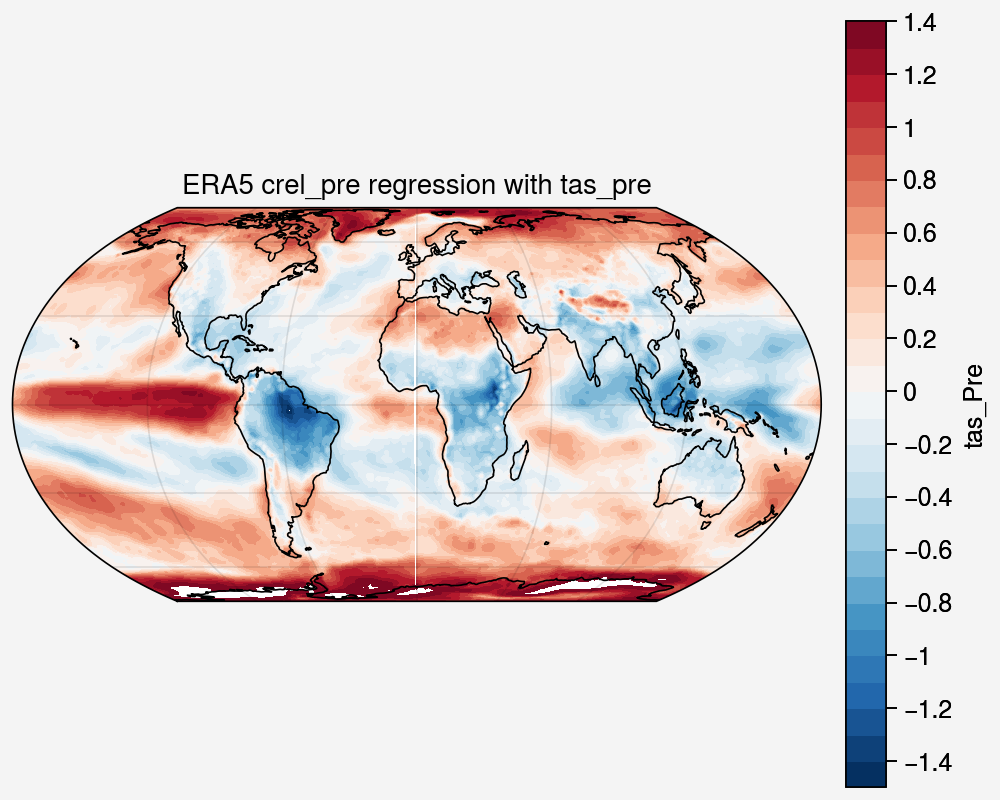

In [107]:
files='/home/jupyter-dipti/work/ISMR_CITCZ/Data/Regrided_ERA5.nc'
#Open ERA5 Dataset
data=xr.open_dataset(files)

crel_pre=data['crel_Pre']
tas_pre=data['tas_Pre']

lat=crel_pre.lat
lon=crel_pre.lon

tas_pre['time']=crel_pre['time']
    
    #Define the two standard deviation above mean condition for regression
mystd=tas_pre.std()
twostd=mystd*2
mymean=tas_pre.mean()
condition=twostd+mymean

#define the regression function
def linear_trend(x,y): 
    mask=np.isfinite(x)&np.isfinite(y)
    if len(x[mask])==0:
        return np.nan
    else:
        pf=np.polyfit(x[mask],y[mask],1)
        return xr.DataArray(pf[0])

def ints(x,y):
    mask=np.isfinite(x)&np.isfinite(y)
    if len(x[mask])==0:
        return np.nan
    else:
        ipf=np.polyfit(x[mask],y[mask],1)
        return xr.DataArray(ipf[1])
    
    
    #Apply regression function using ufunc to get regression coefficients/slopes
slopes=xr.apply_ufunc(linear_trend,
                    tas_pre,crel_pre,
                    vectorize=True,
                    dask='parallelized',
                    input_core_dims=[['time'],['time']],
                    )


intercepts=xr.apply_ufunc(ints,
                    tas_pre,crel_pre,
                    vectorize=True,
                    dask='parallelized',
                    input_core_dims=[['time'],['time']],
                    )


regression=slopes*condition+intercepts

fig,axes=pplt.subplots(figsize=(5,4),proj='eqearth')
con=axes.contourf(lon,lat,regression,levels=np.arange(-1.5,1.5,0.1))
axes.set_title('ERA5 crel_pre regression with tas_pre')

fig.format(coast=True)
#cbar=plt.colorbar(con)
#cbar.set_label('Regression (W/$m^2$)')

<xarray.DataArray ()>
array(-0.06132055)


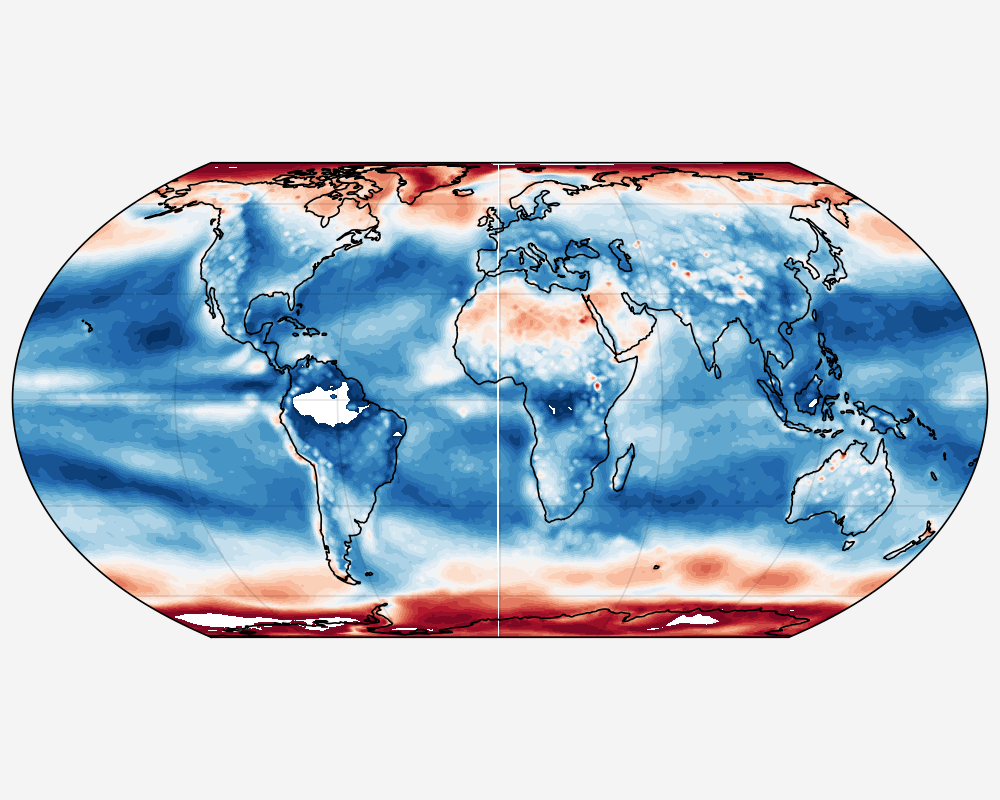

In [132]:
files='/home/jupyter-dipti/work/ISMR_CITCZ/Data/Regrided_ERA5.nc'
#Open ERA5 Dataset
data=xr.open_dataset(files)

crelSurf_pre=data['crelSurf_Pre']
tas_pre=data['tas_Pre']

lat=crelSurf_pre.lat
lon=crelSurf_pre.lon

tas_pre['time']=crelSurf_pre['time']
    
    #Define the two standard deviation above mean condition for regression
mystd=tas_pre.std()
twostd=mystd*2
mymean=tas_pre.mean()
condition=twostd+mymean

#define the regression function
def linear_trend(x,y): 
    mask=np.isfinite(x)&np.isfinite(y)
    if len(x[mask])==0:
        return np.nan
    else:
        pf=np.polyfit(x[mask],y[mask],1)
        return xr.DataArray(pf[0])

def ints(x,y):
    mask=np.isfinite(x)&np.isfinite(y)
    if len(x[mask])==0:
        return np.nan
    else:
        ipf=np.polyfit(x[mask],y[mask],1)
        return xr.DataArray(ipf[1])
    
    
    #Apply regression function using ufunc to get regression coefficients/slopes
slopes=xr.apply_ufunc(linear_trend,
                    tas_pre,crelSurf_pre,
                    vectorize=True,
                    dask='parallelized',
                    input_core_dims=[['time'],['time']],
                    )


intercepts=xr.apply_ufunc(ints,
                    tas_pre,crelSurf_pre,
                    vectorize=True,
                    dask='parallelized',
                    input_core_dims=[['time'],['time']],
                    )


regression=slopes*condition+intercepts
corr=xr.corr(tas_pre,crelSurf_pre)

fig,axes=pplt.subplots(figsize=(5,4),proj='eqearth')
con=axes.contourf(lon,lat,regression,levels=np.arange(-1.5,1.5,0.1))
axes.set_title('ERA5 crelSurf_pre regression with tas_pre,Corr='+str(corr)+)

fig.format(coast=True)
#cbar=plt.colorbar(con)
#cbar.set_label('Regression (W/$m^2$)')

In [124]:
testpath='../../../home/jupyter-haruki/work/processed/to_s3/compress.isosph5.CESM2.historical.r1i1p1f1.Input.Exp8_fixed.nc'
data=xr.open_dataset(testpath)

testpathout='../../../home/jupyter-haruki/work/processed/to_s3/compress.isosph5.CESM2.historical.r1i1p1f1.Output.nc'
data1=xr.open_dataset(testpathout)


cres=data.cres_pre
ts=data1.tas_pre



<xarray.DataArray ()>
array(0.04868778)
Attributes:
    long_name:      Near-Surface Air Temperature
    units:          K
    CDI_grid_type:  unstructured